### This notebook contains training scripts for "Training 3D U-Net for BraTS2023-GLI"

The following are the MRI Scans Modalities in the BraTS Dataset:

------------------------------------------------------------------------------------------------------

i. Native (T1) 

ii. Post-contrast T1-weighted (T1CE)

iii. T2-weighted (T2)

iv. T2 Fluid Attenuated Inversion Recovery (FLAIR) volumes


| **Class Index** | **Description**                         | **Viridis Color (for visualization)** |
|-----------------|-----------------------------------------|--------------------------------------|
| 0               | Background                              | Dark purple (or black)               |
| 1               | Necrotic and Non-enhancing Tumor Core   | Blue or dark green                   |
| 2               | Peritumoral Edema/Invaded Tissue        | Light green or teal                  |
| 3               | GD-Enhancing Tumor                      | Yellow                               |

In [1]:
# !pip install nibabel -q
# !pip install scikit-learn -q
# !pip install tifffile -q
# !pip install tqdm -q
# !pip install split-folders -q
# !pip install torchinfo -q
# !pip install segmentation-models-pytorch-3d -q
# !pip install livelossplot -q
# !pip install torchmetrics -q
# !pip install tensorboard -q

In [2]:
import os
import random
import splitfolders
from tqdm import tqdm
import nibabel as nib
import glob
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
import shutil
import time

from dataclasses import dataclass

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.optim import Adam
from torch.optim.lr_scheduler import CosineAnnealingLR
import torchvision.transforms as transforms
from torch.cuda import amp

from torchmetrics import MeanMetric
from torchmetrics.classification import MulticlassAccuracy

from torch.utils.data import Dataset, DataLoader
from torch.utils.tensorboard import SummaryWriter
from torchinfo import summary
import gc

import segmentation_models_pytorch_3d as smp

from livelossplot import PlotLosses
from livelossplot.outputs import MatplotlibPlot, ExtremaPrinter

In [7]:
def seed_everything(SEED):
    np.random.seed(SEED)
    torch.manual_seed(SEED)
    torch.cuda.manual_seed_all(SEED)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

def get_default_device():
    gpu_available = torch.cuda.is_available()
    return torch.device('cuda' if gpu_available else 'cpu'), gpu_available

In [8]:
@dataclass(frozen=True)
class TrainingConfig:
    BATCH_SIZE:      int = 5
    EPOCHS:          int = 100
    LEARNING_RATE: float = 1e-3
    CHECKPOINT_DIR:  str = os.path.join('model_checkpoint', '3D_UNet_Brats2023')
    NUM_WORKERS:     int = 4

## Custom DataLoader

In [27]:
class BraTSDataset(Dataset):
    def __init__(self, img_dir, mask_dir, normalization=True):
        super().__init__()
        
        self.img_dir = img_dir
        self.mask_dir = mask_dir
        self.img_list = sorted(os.listdir(img_dir))  # Ensure sorting to match images and masks
        self.mask_list = sorted(os.listdir(mask_dir))
        self.normalization = normalization
        
        # If normalization is True, set up a normalization transform
        if self.normalization:
            self.normalizer = transforms.Normalize(mean=[0.5], std=[0.5])  # Adjust mean and std based on your data
    
    def load_file(self, filepath):
        return np.load(filepath)
    
    def __len__(self):
        return len(self.img_list)

    def __getitem__(self, idx):
        image_path = os.path.join(self.img_dir, self.img_list[idx])
        mask_path = os.path.join(self.mask_dir, self.mask_list[idx])
        
        # Load the image and mask
        image = self.load_file(image_path)
        mask = self.load_file(mask_path)

        # Convert to torch tensors and permute axes to C, D, H, W format (needed for 3D models)
        image = torch.from_numpy(image).permute(3, 2, 0, 1)  # Shape: C, D, H, W
        mask = torch.from_numpy(mask).permute(3, 2, 0, 1)  # Shape: C, D, H, W
        
        # Normalize the image if normalization is enabled
        if self.normalization:
            image = self.normalizer(image)
        
        return image, mask

In [33]:
train_img_dir = "BraTS2023_Preprocessed/input_data_128/train/images"
train_mask_dir = "BraTS2023_Preprocessed/input_data_128/train/masks"


val_img_dir = "BraTS2023_Preprocessed/input_data_128/val/images"
val_mask_dir = "BraTS2023_Preprocessed/input_data_128/val/masks"

val_img_list = os.listdir(val_img_dir)
val_mask_list = os.listdir(val_mask_dir)


# Initialize datasets with normalization only
train_dataset = BraTSDataset(train_img_dir, train_mask_dir, normalization=True)
val_dataset = BraTSDataset(val_img_dir, val_mask_dir, normalization=True)

# Print dataset statistics
print("Total Training Samples: ", len(train_dataset))
print("Total Val Samples: ", len(val_dataset))

Total Training Samples:  431
Total Val Samples:  144


In [36]:
%%time


print("Total Training Samples: ", len(train_dataset))
print("Total Val Samples: ", len(val_dataset))


train_loader = DataLoader(train_dataset, batch_size = 5, shuffle = True, num_workers = 14)
val_loader = DataLoader(val_dataset, batch_size = 5, shuffle = False, num_workers = 14)


                          
#Sanity Check                
images, masks = next(iter(train_loader))
print(f"Train Image batch shape: {images.shape}") 
print(f"Train Mask batch shape: {masks.shape}")    
                          
                          
#Sanity Check                
images, masks = next(iter(val_loader))
print(f"Val Image batch shape: {images.shape}") 
print(f"Val Mask batch shape: {masks.shape}")    

Total Training Samples:  431
Total Val Samples:  144
Train Image batch shape: torch.Size([5, 3, 128, 128, 128])
Train Mask batch shape: torch.Size([5, 4, 128, 128, 128])
Val Image batch shape: torch.Size([5, 3, 128, 128, 128])
Val Mask batch shape: torch.Size([5, 4, 128, 128, 128])
CPU times: user 0 ns, sys: 1.35 s, total: 1.35 s
Wall time: 7.89 s


#### Visualize Ground Truth from DataLoader

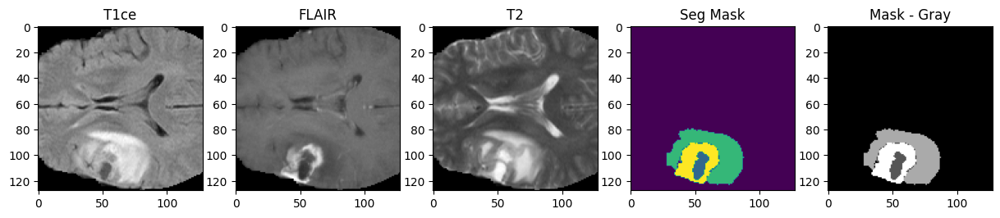

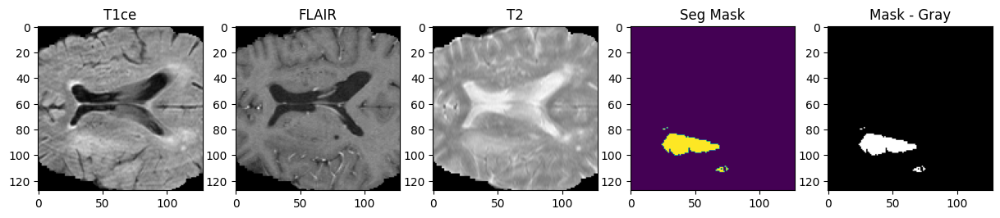

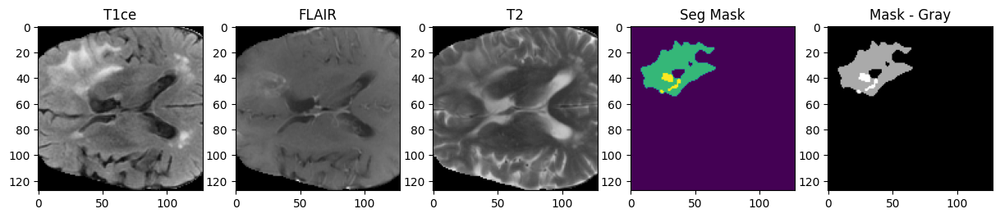

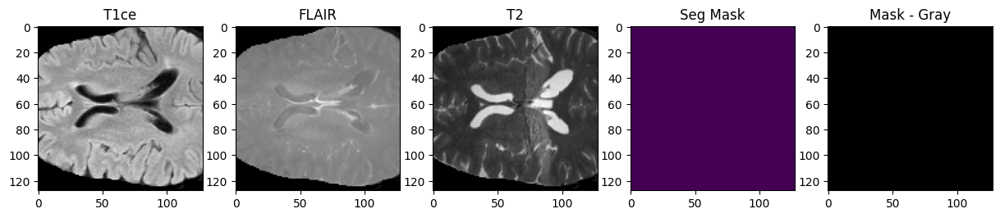

In [10]:
def visualize_slices(images, masks, num_slices=20):
    batch_size = images.shape[0]
    
    masks = torch.argmax(masks, dim=1) #along the channel/class dim
    
    for i in range(min(num_slices, batch_size)):
        fig,ax = plt.subplots(1,5,figsize = (15,5))
        
        middle_slice = images.shape[2] // 2
        ax[0].imshow(images[i,0, middle_slice,:,:], cmap = 'gray')
        ax[1].imshow(images[i, 1, middle_slice, : ,:], cmap = 'gray')
        ax[2].imshow(images[i, 2, middle_slice, :, :], cmap = 'gray')
        ax[3].imshow(masks[i, middle_slice, : ,:], cmap = 'viridis')
        ax[4].imshow(masks[i, middle_slice, : ,:], cmap = 'gray')

        
        ax[0].set_title('T1ce')
        ax[1].set_title('FLAIR')
        ax[2].set_title('T2')
        ax[3].set_title('Seg Mask')
        ax[4].set_title('Mask - Gray')
        
        plt.show()

visualize_slices(images, masks, num_slices = 20)

### Model Definition

### 3D U-Net

In [38]:
# Define the double_conv function 
def double_conv(in_channels, out_channels):
    return nn.Sequential(
        nn.Conv3d(in_channels, out_channels, kernel_size=3, padding=1),
        nn.BatchNorm3d(out_channels),  # Add BatchNorm3d after convolution
        nn.ReLU(inplace=True),
        nn.Dropout(0.1 if out_channels <= 32 else 0.2 if out_channels <= 128 else 0.3),
        nn.Conv3d(out_channels, out_channels, kernel_size=3, padding=1),
        nn.BatchNorm3d(out_channels),  # Add BatchNorm3d after second convolution
        nn.ReLU(inplace=True)
    )

class UNet3D(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()

        # Contraction path
        self.conv1 = double_conv(in_channels=in_channels, out_channels=16)
        self.pool1 = nn.MaxPool3d(kernel_size=2)

        self.conv2 = double_conv(in_channels=16, out_channels=32)
        self.pool2 = nn.MaxPool3d(kernel_size=2)

        self.conv3 = double_conv(in_channels=32, out_channels=64)
        self.pool3 = nn.MaxPool3d(kernel_size=2)

        self.conv4 = double_conv(in_channels=64, out_channels=128)
        self.pool4 = nn.MaxPool3d(kernel_size=2)
        
        self.conv5 = double_conv(in_channels=128, out_channels=256)

        # Expansive path
        self.upconv6 = nn.ConvTranspose3d(in_channels=256, out_channels=128, kernel_size=2, stride=2)
        self.conv6 = double_conv(in_channels=256, out_channels=128)

        self.upconv7 = nn.ConvTranspose3d(in_channels=128, out_channels=64, kernel_size=2, stride=2)
        self.conv7 = double_conv(in_channels=128, out_channels=64)

        self.upconv8 = nn.ConvTranspose3d(in_channels=64, out_channels=32, kernel_size=2, stride=2)
        self.conv8 = double_conv(in_channels=64, out_channels=32)

        self.upconv9 = nn.ConvTranspose3d(in_channels=32, out_channels=16, kernel_size=2, stride=2)
        self.conv9 = double_conv(in_channels=32, out_channels=16)

        self.out_conv = nn.Conv3d(in_channels=16, out_channels=out_channels, kernel_size=1)

    def forward(self, x):
        # Contracting path
        c1 = self.conv1(x)
        p1 = self.pool1(c1)

        c2 = self.conv2(p1)
        p2 = self.pool2(c2)

        c3 = self.conv3(p2)
        p3 = self.pool3(c3)

        c4 = self.conv4(p3)
        p4 = self.pool4(c4)  # downscale

        c5 = self.conv5(p4)

        # Expansive path
        u6 = self.upconv6(c5)  # upscale
        u6 = torch.cat([u6, c4], dim=1)  # skip connections along channel dim
        c6 = self.conv6(u6)

        u7 = self.upconv7(c6)
        u7 = torch.cat([u7, c3], dim=1)
        c7 = self.conv7(u7)

        u8 = self.upconv8(c7)
        u8 = torch.cat([u8, c2], dim=1)
        c8 = self.conv8(u8)

        u9 = self.upconv9(c8)
        u9 = torch.cat([u9, c1], dim=1)
        c9 = self.conv9(u9)

        outputs = self.out_conv(c9)

        return outputs


# Test the model
model = UNet3D(in_channels=3, out_channels=4)
print(model)

# Create a random input tensor
ip_tensor = torch.randn(1, 3, 128, 128, 128)

# Forward pass through the model
output = model(ip_tensor)

# Print input and output shapes
print("-" * 260)
print(f"Input shape: {ip_tensor.shape}")
print(f"Output shape: {output.shape}")


UNet3D(
  (conv1): Sequential(
    (0): Conv3d(3, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
    (1): BatchNorm3d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Dropout(p=0.1, inplace=False)
    (4): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
    (5): BatchNorm3d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU(inplace=True)
  )
  (pool1): MaxPool3d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Sequential(
    (0): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
    (1): BatchNorm3d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Dropout(p=0.1, inplace=False)
    (4): Conv3d(32, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
    (5): BatchNorm3d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   

### Sanity Check

In [21]:
# for data, target in train_loader:
#     data, target = data.to("cuda").float(), target.to("cuda").float()
#     print(target.shape)
#     model = model.to("cuda")
#     output = model(data.float())
    
#     print(output.shape)
#     break

### Training


- DiceLoss (Multiclass): When you use DiceLoss in multiclass mode, it computes the loss across each class separately and combines them. For this, it needs the target to be in the form of class indices to identify the correct class for each voxel.
- In multiclass classification, each voxel (in the 3D case) should belong to one and only one class. Thus, the target should indicate the class index (an integer from 0 to num_classes - 1) for each voxel rather than a one-hot vector.
  

In [39]:
# Define Dice and Focal loss functions
dice_loss = smp.losses.DiceLoss(
    mode="multiclass",          # For multi-class segmentation
    classes=None,               # Compute the loss for all classes
    log_loss=False,             # Do not use log version of Dice loss
    from_logits=True,           # Model outputs are raw logits
    smooth=1e-5,                # A small smoothing factor for stability
    ignore_index=None,          # Don't ignore any classes
    eps=1e-7                    # Epsilon for numerical stability
)

# Focal Loss with optional class balancing via alpha
focal_loss = smp.losses.FocalLoss(
    mode="multiclass",          # Multi-class segmentation
    alpha=0.25,                 # class weighting to deal with class imbalance
    gamma=2.0                   # Focusing parameter for hard-to-classify examples
)


def combined_loss(output, target):
    loss1 = dice_loss(output, target)
    loss2 = focal_loss(output, target)
    return loss1 + loss2 

In [41]:
# Train one epoch, including macro IoU and class-wise IoU logging.
def train_one_epoch(
    model,
    loader,
    optimizer,
    num_classes,
    device="cpu",
    epoch_idx=800,
    total_epochs=50):

    model.train()

    loss_record = MeanMetric()
    metric_record = MeanMetric()
    acc_record = MulticlassAccuracy(num_classes=num_classes, average='macro')  # Use macro-average accuracy

    loader_len = len(loader)

    with tqdm(total=loader_len, ncols=122) as tq:
        tq.set_description(f"Train ::  Epoch: {epoch_idx}/{total_epochs}")

        for data, target in loader:
            tq.update(1)

            data, target = data.to(device).float(), target.to(device).float()

            optimizer.zero_grad()

            output_dict = model(data)

            target = target.argmax(dim=1)  # Convert one-hot to class indices

            clsfy_out = output_dict  # classifier head output

            loss = combined_loss(clsfy_out, target)

            # Calculate gradients w.r.t training parameters
            loss.backward()
            optimizer.step()

            # Detach for evaluation
            with torch.no_grad():
                pred_idx = clsfy_out.argmax(dim=1)

                # Calculate stats and IoU
                tp, fp, fn, tn = smp.metrics.get_stats(pred_idx, target, mode='multiclass', num_classes=num_classes)
                
                # Macro IoU and class-wise IoU
                metric_macro = smp.metrics.iou_score(tp, fp, fn, tn, reduction='macro')

                acc_record.update(pred_idx.cpu(), target.cpu())
                loss_record.update(loss.detach().cpu(), weight=data.shape[0])
                metric_record.update(metric_macro.cpu(), weight=data.shape[0])

            tq.set_postfix_str(s=f"Loss: {loss_record.compute():.4f}, IOU: {metric_record.compute():.4f}, Acc: {acc_record.compute():.4f}")

    epoch_loss = loss_record.compute()
    epoch_metric = metric_record.compute()
    epoch_acc = acc_record.compute()

    return epoch_loss, epoch_metric, epoch_acc

In [42]:

# Validation function, logging macro IoU and per-class IoU.
def validate(
    model,
    loader,
    device,
    num_classes,
    epoch_idx,
    total_epochs
):
    model.eval()

    loss_record = MeanMetric()
    metric_record = MeanMetric()
    acc_record = MulticlassAccuracy(num_classes=num_classes, average='macro')

    loader_len = len(loader)

    with tqdm(total=loader_len, ncols=122) as tq:
        tq.set_description(f"Valid :: Epoch: {epoch_idx}/{total_epochs}")

        for data, target in loader:
            tq.update(1)

            data, target = data.to(device).float(), target.to(device).float()

            with torch.no_grad():
                output_dict = model(data)

            clsfy_out = output_dict
            target = target.argmax(dim=1)  # Convert one-hot to class indices

            loss = combined_loss(clsfy_out, target)
            pred_idx = clsfy_out.argmax(dim=1)

            tp, fp, fn, tn = smp.metrics.get_stats(pred_idx, target, mode='multiclass', num_classes=num_classes)
            
            # Macro IoU 
            metric_macro = smp.metrics.iou_score(tp, fp, fn, tn, reduction='macro')

            acc_record.update(pred_idx.cpu(), target.cpu())
            loss_record.update(loss.cpu(), weight=data.shape[0])
            metric_record.update(metric_macro.cpu(), weight=data.shape[0]) #data.shape = batch

        valid_epoch_loss = loss_record.compute()
        valid_epoch_metric = metric_record.compute()
        valid_epoch_acc = acc_record.compute()

    return valid_epoch_loss, valid_epoch_metric, valid_epoch_acc


In [43]:
# Main function with logging and saving model checkpoints.
def main(*, model, optimizer, ckpt_dir, pin_memory=True, device='cpu'):

    total_epochs = TrainingConfig.EPOCHS

    # Move model to the correct device before the loop starts
    model.to(device, non_blocking = True)

    writer = SummaryWriter(log_dir=os.path.join(ckpt_dir, 'tboard_logs'))
    best_loss = float("inf")
    live_plot = PlotLosses(outputs=[MatplotlibPlot(cell_size=(8, 3)), ExtremaPrinter()])

    for epoch in range(total_epochs):
        current_epoch = epoch + 1

        torch.cuda.empty_cache()
        gc.collect()

        # Train one epoch
        train_loss, train_metric, train_acc = train_one_epoch(
            model=model, loader=train_loader, optimizer=optimizer,
            num_classes=4, device=device, epoch_idx=current_epoch, total_epochs=total_epochs
        )

        # Validate after each epoch
        valid_loss, valid_metric, valid_acc = validate(
            model=model, loader=val_loader, device=device, 
            num_classes=4, epoch_idx=current_epoch, total_epochs=total_epochs
        )

        # Update live plot
        live_plot.update({
            "loss": train_loss,
            "val_loss": valid_loss,
            "accuracy": train_acc,
            "val_accuracy": valid_acc,
            "IoU": train_metric,
            "val_IoU": valid_metric
        })

        live_plot.send()

        # Write training and validation metrics to TensorBoard
        writer.add_scalar('Loss/train', train_loss, current_epoch)
        writer.add_scalar('Loss/valid', valid_loss, current_epoch)
        writer.add_scalar('Accuracy/train', train_acc, current_epoch)
        writer.add_scalar('Accuracy/valid', valid_acc, current_epoch)
        writer.add_scalar('IoU/train', train_metric, current_epoch)
        writer.add_scalar('IoU/valid', valid_metric, current_epoch)

        # Step the Cosine Annealing LR scheduler
        # scheduler.step()
        
        # Save the model if validation loss improves
        if valid_loss < best_loss:
            best_loss = valid_loss
            print("Model Improved. Saving...", end="")

            checkpoint_dict = {
                "opt": optimizer.state_dict(),
                "model": model.state_dict(),
            }
            torch.save(checkpoint_dict, os.path.join(ckpt_dir, "ckpt.tar"))
            del checkpoint_dict
            print("Done.\n")

    writer.close()
    return

### Model Checkpoint Helper Function

In [44]:
def create_checkpoint_dir(checkpoint_dir):
    if not os.path.exists(checkpoint_dir):
        os.makedirs(checkpoint_dir)

    try:
        num_versions = [int(i.split("_")[-1]) for i in os.listdir(checkpoint_dir) if "version" in i]
        version_num = max(num_versions) + 1
        
    except:
        version_num = 0

    version_dir = os.path.join(checkpoint_dir, "version_" + str(version_num)) 
    os.makedirs(version_dir)

    print(f"Checkpoint directory: {version_dir}")
    return version_dir

In [45]:
seed_everything(SEED = 42)

DEVICE, GPU_AVAILABLE  = get_default_device()
print(DEVICE)

CKPT_DIR = create_checkpoint_dir(TrainingConfig.CHECKPOINT_DIR)

from torch.optim import AdamW

optimizer = AdamW(
    model.parameters(),
    lr=TrainingConfig.LEARNING_RATE,  
    weight_decay=1e-2,                # Regularization to avoid overfitting
    amsgrad=True                      # Optional AMSGrad variant
)
scheduler = CosineAnnealingLR(optimizer, T_max=TrainingConfig.EPOCHS)


cuda
Checkpoint directory: model_checkpoint/3D_UNet_Brats2023/version_0


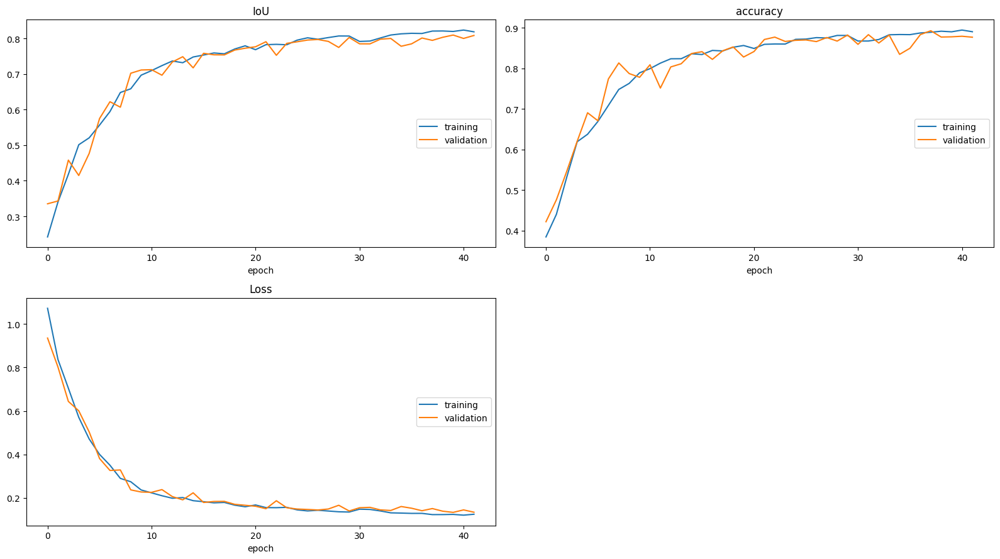

IoU
	training         	 (min:    0.242, max:    0.823, cur:    0.818)
	validation       	 (min:    0.335, max:    0.809, cur:    0.808)
accuracy
	training         	 (min:    0.385, max:    0.894, cur:    0.890)
	validation       	 (min:    0.422, max:    0.893, cur:    0.877)
Loss
	training         	 (min:    0.120, max:    1.073, cur:    0.125)
	validation       	 (min:    0.133, max:    0.936, cur:    0.134)


Train ::  Epoch: 43/100:  92%|██████████████████▍ | 80/87 [02:15<00:11,  1.69s/it, Loss: 0.1191, IOU: 0.8252, Acc: 0.8939]

In [ ]:
main(
    model = model,
    optimizer = optimizer,
    ckpt_dir = CKPT_DIR,
    device  = DEVICE,
    pin_memory = GPU_AVAILABLE
)

### Load Trained Model

In [49]:
DEVICE, GPU_AVAILABLE = get_default_device()

trained_model = UNet3D(in_channels = 3, out_channels = 4)

trained_model.load_state_dict(torch.load("model_checkpoint/3D_UNet_Brats2023/version_0/ckpt.tar", map_location = "cpu")['model'])

trained_model.to(DEVICE)
trained_model.eval()

/tmp/ipykernel_401/2735865689.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  trained_model.load_state_dict(torch.load("model_checkpoint/3D_UNet_Brats2023/version_0/ckpt

UNet3D(
  (conv1): Sequential(
    (0): Conv3d(3, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
    (1): BatchNorm3d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Dropout(p=0.1, inplace=False)
    (4): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
    (5): BatchNorm3d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU(inplace=True)
  )
  (pool1): MaxPool3d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Sequential(
    (0): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
    (1): BatchNorm3d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Dropout(p=0.1, inplace=False)
    (4): Conv3d(32, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
    (5): BatchNorm3d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   

| **Class Index** | **Description**                         | **Viridis Color (for visualization)** |
|-----------------|-----------------------------------------|--------------------------------------|
| 0               | Background                              | Dark purple (or black)               |
| 1               | Necrotic and Non-enhancing Tumor Core   | Blue or dark green                   |
| 2               | Peritumoral Edema                       | Light green or teal                  |
| 3               | Enhancing Tumor                         | Yellow                               |


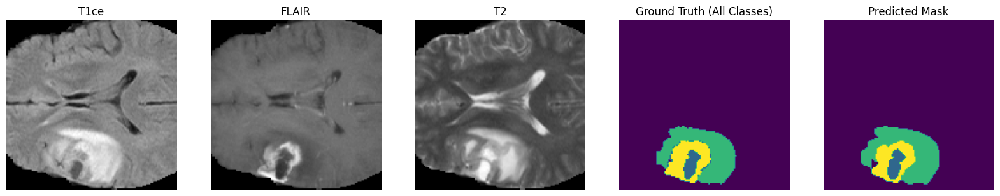

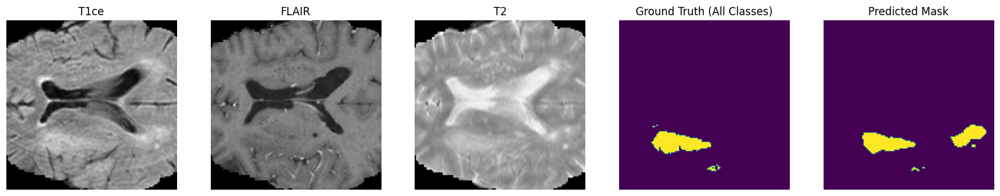

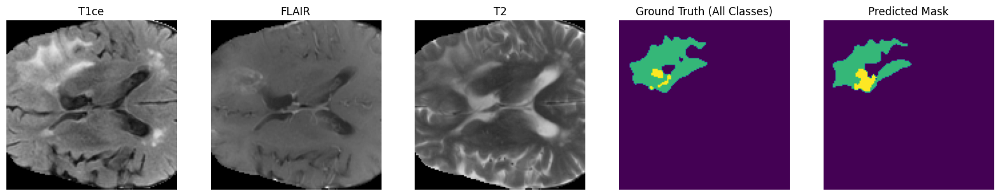

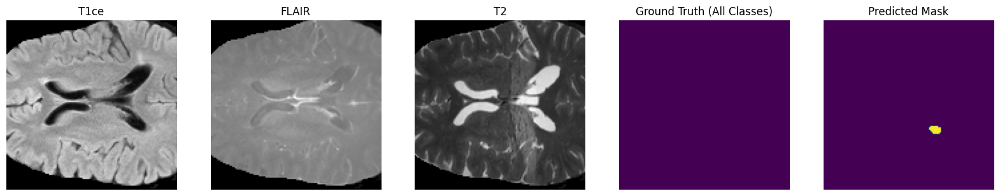

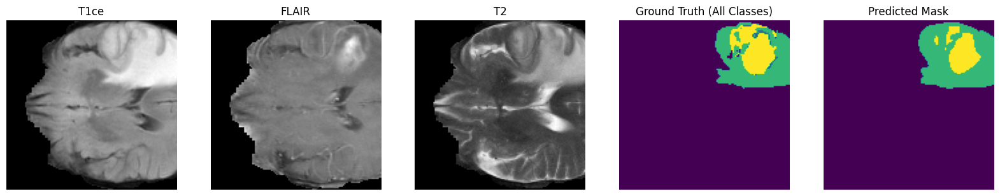

...

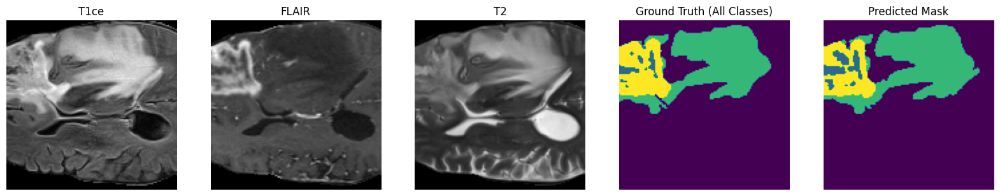

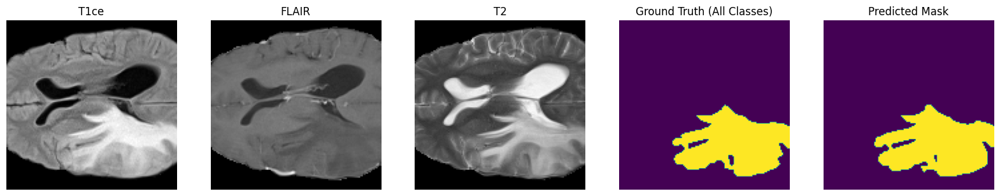

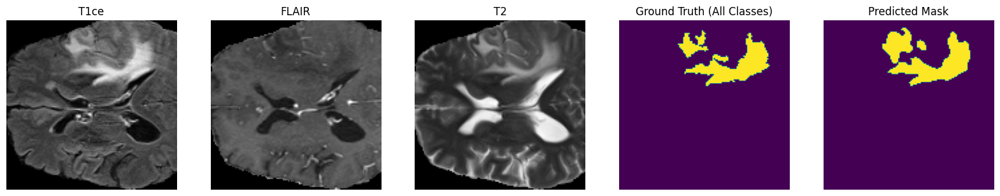

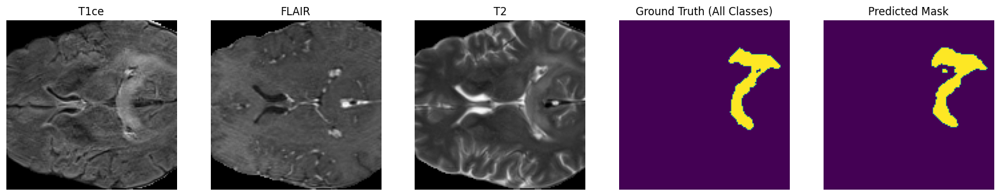

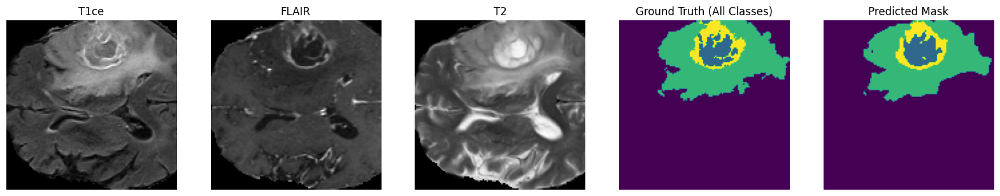

In [51]:
@torch.inference_mode()
def inference(model, loader, device="cpu", num_batches_to_process=8):
    for idx, (batch_img, batch_mask) in enumerate(loader):
        # Move batch images to the device (CPU or GPU)
        batch_img = batch_img.to(device).float()
        
        # Get the predictions from the model
        pred_all = model(batch_img)
        
        # Move the predictions to CPU and apply argmax to get predicted classes
        pred_all = pred_all.cpu().argmax(dim=1).numpy()
        
        # Optionally break after processing a fixed number of batches
        if idx == num_batches_to_process:
            break

        # Visualize images and predictions
        for i in range(0, len(batch_img)):
            fig, ax = plt.subplots(1, 5, figsize=(20, 8))
            
            middle_slice = batch_img.shape[2] // 2  # Along Depth
            
            # Visualize different modalities (e.g., T1ce, FLAIR, T2)
            ax[0].imshow(batch_img[i, 0, middle_slice, :, :].cpu().numpy(), cmap='gray')
            ax[1].imshow(batch_img[i, 1, middle_slice, :, :].cpu().numpy(), cmap='gray')
            ax[2].imshow(batch_img[i, 2, middle_slice, :, :].cpu().numpy(), cmap='gray')

            # Get the ground truth mask as class indices using argmax (combine all classes)
            gt_combined = batch_mask[i, :, middle_slice, :, :].argmax(dim=0).cpu().numpy()

            # Visualize the ground truth mask
            ax[3].imshow(gt_combined, cmap='viridis')
            ax[3].set_title('Ground Truth (All Classes)')

            # Visualize the predicted mask
            ax[4].imshow(pred_all[i, middle_slice, :, :], cmap='viridis')
            ax[4].set_title('Predicted Mask')
            
            # Set titles for the image subplot
            ax[0].set_title('T1ce')
            ax[1].set_title('FLAIR')
            ax[2].set_title('T2')
            
            # Turn off axis for all subplots
            for a in ax:
                a.axis('off')
            
            # Show the plot
            plt.show()

# Run inference
inference(model, val_loader, device="cuda", num_batches_to_process=12)


##### Save grid plot locally

In [ ]:
@torch.inference_mode()
def inference(model, loader, device="cpu", num_batches_to_process=8, save_path="./outputs/"):
    import os
    if not os.path.exists(save_path):
        os.makedirs(save_path)

    for idx, (batch_img, batch_mask) in enumerate(loader):
        # Move batch images to the device (CPU or GPU)
        batch_img = batch_img.to(device).float()
        
        # Get the predictions from the model
        pred_all = model(batch_img)
        
        # Move the predictions to CPU and apply argmax to get predicted classes
        pred_all = pred_all.cpu().argmax(dim=1).numpy()
        
        # Optionally break after processing a fixed number of batches
        if idx == num_batches_to_process:
            break

        # Create a figure for the entire batch
        fig, ax = plt.subplots(len(batch_img), 5, figsize=(20, 8 * len(batch_img)))

        # Visualize images and predictions for each sample in the batch
        for i in range(0, len(batch_img)):
            middle_slice = batch_img.shape[2] // 2  # Along Depth
            
            # Visualize different modalities (e.g., T1ce, FLAIR, T2)
            ax[i, 0].imshow(batch_img[i, 0, middle_slice, :, :].cpu().numpy(), cmap='gray')
            ax[i, 1].imshow(batch_img[i, 1, middle_slice, :, :].cpu().numpy(), cmap='gray')
            ax[i, 2].imshow(batch_img[i, 2, middle_slice, :, :].cpu().numpy(), cmap='gray')

            # Get the ground truth mask as class indices using argmax (combine all classes)
            gt_combined = batch_mask[i, :, middle_slice, :, :].argmax(dim=0).cpu().numpy()

            # Visualize the ground truth mask
            ax[i, 3].imshow(gt_combined, cmap='viridis')
            ax[i, 3].set_title('Ground Truth (All Classes)')

            # Visualize the predicted mask
            ax[i, 4].imshow(pred_all[i, middle_slice, :, :], cmap='viridis')
            ax[i, 4].set_title('Predicted Mask')

            # Set titles for the image subplot
            ax[i, 0].set_title('T1ce')
            ax[i, 1].set_title('FLAIR')
            ax[i, 2].set_title('T2')
            
            # Turn off axis for all subplots
            for a in ax[i]:
                a.axis('off')

        # Save the entire figure for the batch locally
        fig_save_path = os.path.join(save_path, f"batch_{idx}.png")
        plt.savefig(fig_save_path, dpi=300, bbox_inches='tight')  # Save with high resolution (300 DPI)
        
        # Show the plot for the batch
        plt.show()

# Run inference
inference(model, val_loader, device="cuda", num_batches_to_process=8)


#### Visualize Predictions as Video

In [ ]:
!pip install imageio[ffmpeg] -q

In [ ]:
import os
import matplotlib.pyplot as plt
import numpy as np
import imageio

# Define a directory to save frames
output_dir = "3d_vis_frames"
os.makedirs(output_dir, exist_ok=True)

# Define a colormap for multiple classes (e.g., 3 classes: background, tumor core, enhancing tumor)
# You can modify these colors to better suit your needs
CLASS_COLORS = {
    0: (0, 0, 0),     # Class 0: Black (Background)
    1: (1, 0, 0),     # Class 1: Red (Tumor Core)
    2: (0, 1, 0),     # Class 2: Green (Edema)
    3: (0, 0, 1),     # Class 3: Blue (Enhancing Tumor)
}

def overlay_mask_on_image(image, mask, alpha=0.5, class_colors=CLASS_COLORS):
    """Overlay a multi-class mask on the grayscale image."""
    # Normalize the image and convert it to RGB
    img = (image - image.min()) / (image.max() - image.min())
    img = np.stack([img, img, img], axis=-1)  # Convert grayscale to RGB

    # Apply the class colors for the mask
    color_mask = np.zeros_like(img)
    for class_id, color in class_colors.items():
        for i in range(3):  # Apply color per channel
            color_mask[:, :, i] += color[i] * (mask == class_id)

    # Blend the color mask with the original image
    overlayed = img * (1 - alpha) + color_mask * alpha
    return overlayed

@torch.inference_mode()
def create_3d_vis_video(model, loader, device="cpu", num_batches_to_process=8):
    for idx, (batch_img, batch_mask) in enumerate(loader):
        # Move batch images to the device (CPU or GPU)
        batch_img = batch_img.to(device).float()

        # Get the predictions from the model
        pred_all = model(batch_img)

        # Move the predictions to CPU and apply argmax to get predicted classes
        pred_all = pred_all.cpu().argmax(dim=1).numpy()

        # Optionally break after processing a fixed number of batches
        if idx == num_batches_to_process:
            break

        # Iterate through each volume in the batch
        for i in range(len(batch_img)):
            frames = []  # To store each frame as an image
            
            num_slices = batch_img.shape[2]  # Number of slices along the depth axis
            
            for slice_idx in range(num_slices):  # Iterate through all slices in the 3D volume
                fig, ax = plt.subplots(1, 3, figsize=(15, 8))

                # Get the FLAIR slice (index 1)
                flair_slice = batch_img[i, 1, slice_idx, :, :].cpu().numpy()

                # Ground Truth Mask
                gt_mask = batch_mask[i, :, slice_idx, :, :].argmax(dim=0).cpu().numpy()

                # Predicted Mask
                pred_slice = pred_all[i, slice_idx, :, :]

                # Plot the FLAIR slice
                ax[0].imshow(flair_slice, cmap='gray')
                ax[0].set_title('FLAIR Slice')

                # Plot the FLAIR slice with ground truth mask overlaid using consistent color coding
                overlay_gt = overlay_mask_on_image(flair_slice, gt_mask, alpha=0.5, class_colors=CLASS_COLORS)
                ax[1].imshow(overlay_gt)
                ax[1].set_title('FLAIR with Ground Truth Overlay')

                # Plot the FLAIR slice with predicted mask overlaid using the same color coding
                overlay_pred = overlay_mask_on_image(flair_slice, pred_slice, alpha=0.5, class_colors=CLASS_COLORS)
                ax[2].imshow(overlay_pred)
                ax[2].set_title('FLAIR with Prediction Overlay')

                # Turn off axis for all subplots
                for a in ax:
                    a.axis('off')

                # Save the frame as a temporary file
                frame_filename = os.path.join(output_dir, f"frame_{i}_{slice_idx}.png")
                plt.savefig(frame_filename)
                plt.close(fig)

                # Append the frame to the list
                frames.append(frame_filename)

            # Create a video using the frames with half the speed (fps=5)
            video_filename = f"3d_prediction_video_batch_{idx}_sample_{i}.mp4"
            with imageio.get_writer(video_filename, mode='I', fps=5) as writer:
                for frame in frames:
                    image = imageio.imread(frame)
                    writer.append_data(image)

            print(f"Saved 3D visualization video: {video_filename}")

# Run inference and create the 3D visualization video
create_3d_vis_video(trained_model, val_loader, device="cuda", num_batches_to_process=10)